In [1]:
from PIL import Image
import numpy as np
from numpy import asarray
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import math
from numpy.linalg import inv
import matplotlib
import cv2

In [2]:
def get_mag(img):
    f = np.fft.fft2(img)
    f = np.fft.fftshift(f)
    mag = np.abs(f)**2
    
    return mag

In [3]:
def display_mag(img): 
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    #return np.abs(fshift)
    magnitude_spectrum_display = 20*np.log(np.abs(fshift))
    return magnitude_spectrum_display 

In [4]:
def get_phase(img):
    dft = np.fft.fft2(img)
    dft_shift = np.fft.fftshift(dft)
    phase_spectrum = np.angle(dft_shift)
    return phase_spectrum

In [5]:
def mask(img, filter_f):
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    
    fshift_res = fshift * filter_f
    
    f_ishift = np.fft.ifftshift(fshift_res)
    inv_img = np.fft.ifft2(f_ishift)
    inv_img = np.abs(inv_img)
        
    return inv_img

# Q1

In [6]:
q1_img = cv2.imread('snakes-ladders.jpg', 0)

q1_res = np.zeros((q1_img.shape))
for x in range(q1_img.shape[0]):
    for y in range(q1_img.shape[1]):
        q1_res[x][y] = (np.sin(0.1*x)+np.sin(0.2*x)+np.cos(0.4*x)+np.sin(np.sqrt(x**2+y**2)*0.15)+np.sin(np.sqrt(x**2+y**2)*0.35))
        #q1_res[x][y] = np.sin(0.1*x)+np.sin(0.2*x)+np.cos(0.4*x)
        #q1_res[x][y] =np.sin(np.sqrt(x**2+y**2)*0.15)+np.sin(np.sqrt(x**2+y**2)*0.35)

(<AxesSubplot:>, <matplotlib.image.AxesImage at 0x16863ffe9c8>)

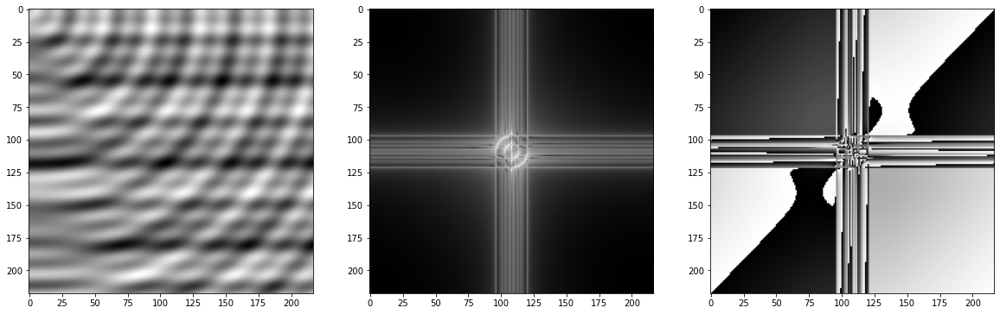

In [7]:
mag = display_mag(q1_res)
phase = get_phase(q1_res)

plt.figure(figsize=(20, 20))
plt.subplot(131),plt.imshow(q1_res, cmap = 'gray')
plt.subplot(132),plt.imshow(mag, cmap = 'gray')
plt.subplot(133),plt.imshow(phase, cmap = 'gray')

# Q2

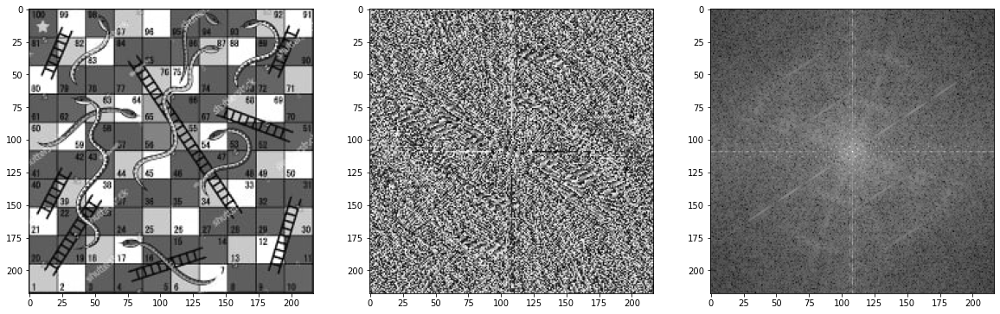

In [8]:
q2_img = cv2.imread('snakes-ladders.jpg',0)
# q2_img = cv2.imread('chess.png',0)

mag = display_mag(q2_img)
phase = get_phase(q2_img)

plt.figure(figsize=(20,20))
plt.subplot(131),plt.imshow(q2_img, cmap = 'gray')
plt.subplot(132),plt.imshow(phase, cmap = 'gray')
plt.subplot(133),plt.imshow(mag , cmap = 'gray')
plt.show() 

# Q3

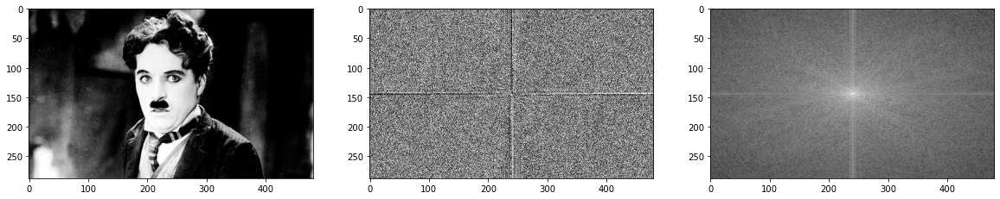

In [9]:
q3_img = cv2.imread('charli.jpeg', 0)


mag_o = display_mag(q3_img)
phase_o = get_phase(q3_img)

plt.figure(figsize=(20,20))
plt.subplot(231),plt.imshow(q3_img, cmap = 'gray')
plt.subplot(232),plt.imshow(phase_o, cmap = 'gray')
plt.subplot(233),plt.imshow(mag_o , cmap = 'gray')
plt.show()

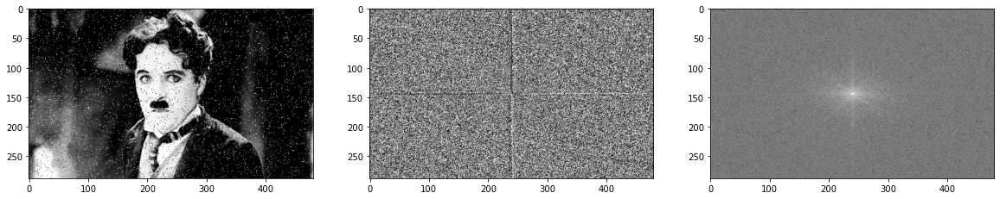

In [10]:
sp_intensity = 5 # 0-100
sp_img = np.array(q3_img)

sp_count = int((sp_intensity/100) * (q3_img.shape[0]*q3_img.shape[1]))

for count in range(sp_count):
    x = random.randint(0, q3_img.shape[0]-1)
    y = random.randint(0, q3_img.shape[1]-1)
    b_or_w = random.randint(0, 1)
    sp_img[x][y] = b_or_w * 255
    
mag = display_mag(sp_img)
phase = get_phase(sp_img)

plt.figure(figsize=(20,20))
plt.subplot(234),plt.imshow(sp_img, cmap = 'gray')
plt.subplot(235),plt.imshow(phase, cmap = 'gray')
plt.subplot(236),plt.imshow(mag , cmap = 'gray')
plt.show() 

In [11]:
# lowpass gaussian filter
def lpgf(img, d0):
    lpgf = np.zeros((img.shape))
    cx = img.shape[0]/2
    cy = img.shape[1]/2
    
    for x in range(img.shape[0]):
        for y in range(img.shape[1]):
            d = np.sqrt( (x-cx)**2 + (y-cy)**2 )
            lpgf[x][y] = np.exp(-(d**2)/(2*d0**2))
    
    return np.abs(lpgf)

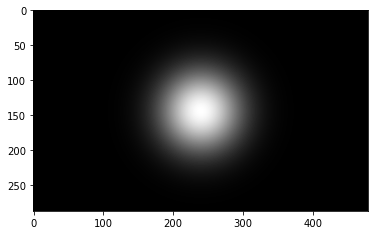

In [12]:
lpg_filter = lpgf(q3_img, 40)
plt.subplot(111),plt.imshow(lpg_filter, cmap = 'gray')
plt.show()

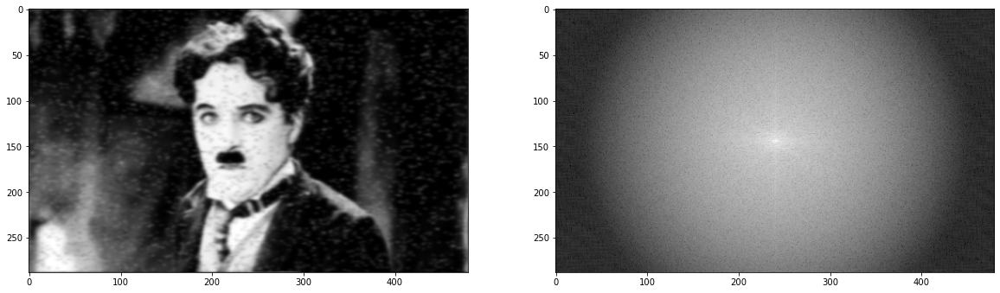

In [13]:
sp_img_g = mask(sp_img, lpg_filter)

plt.figure(figsize=(20,20))
mag = display_mag(sp_img_g)
plt.subplot(121),plt.imshow(sp_img_g, cmap = 'gray')
plt.subplot(122),plt.imshow(mag , cmap = 'gray')

plt.show()

# Q4

### q4.1

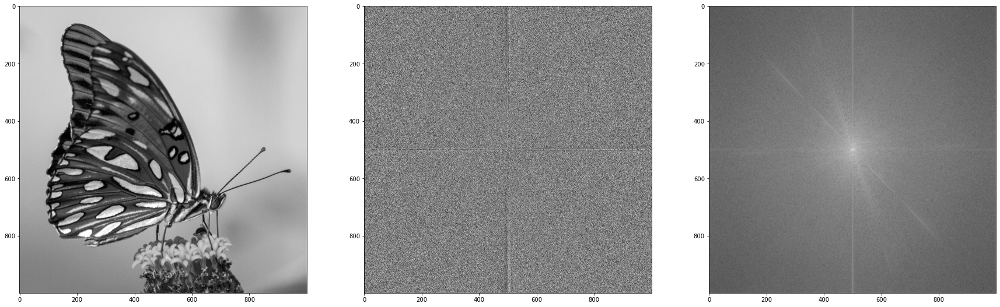

In [14]:
q4_img = cv2.imread('butterfly.jpeg', 0)
mag = display_mag(q4_img)
phase = get_phase(q4_img)

plt.figure(figsize=(30,30))
plt.subplot(131),plt.imshow(q4_img, cmap = 'gray')
plt.subplot(132),plt.imshow(phase, cmap = 'gray')
plt.subplot(133),plt.imshow(mag , cmap = 'gray')
plt.show() 

### q4.2
since rotating without croping/zooming creates the black edges, we need to zoom in center.

In [15]:
def zoom_center(img, zoom_factor=1.5):

    y_size = img.shape[0]
    x_size = img.shape[1]
    
    # define new boundaries
    x1 = int(0.5*x_size*(1-1/zoom_factor))
    x2 = int(x_size-0.5*x_size*(1-1/zoom_factor))
    y1 = int(0.5*y_size*(1-1/zoom_factor))
    y2 = int(y_size-0.5*y_size*(1-1/zoom_factor))

    # first crop image then scale
    img_cropped = img[y1:y2,x1:x2]
    return cv2.resize(img_cropped, None, fx=zoom_factor, fy=zoom_factor)

Before rotation: 

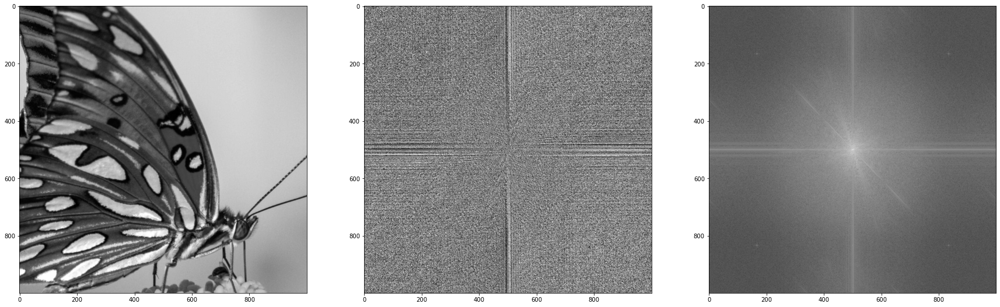

In [16]:
q4_img_zoom = zoom_center(q4_img, 1.5)
mag = display_mag(q4_img_zoom)
phase = get_phase(q4_img_zoom)

plt.figure(figsize=(30,30))
plt.subplot(131),plt.imshow(q4_img_zoom, cmap = 'gray')
plt.subplot(132),plt.imshow(phase, cmap = 'gray')
plt.subplot(133),plt.imshow(mag , cmap = 'gray')
plt.show() 

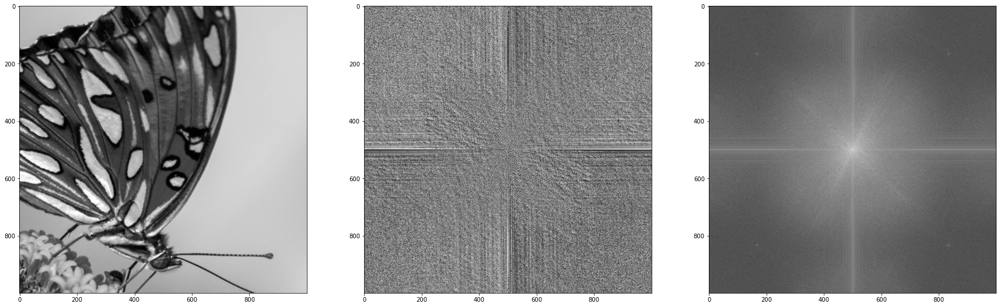

In [17]:
from scipy import ndimage

rotated = ndimage.rotate(q4_img, -45, reshape=False)
zoom_rt = zoom_center(rotated, 1.5)

mag = display_mag(zoom_rt)
phase = get_phase(zoom_rt)

plt.figure(figsize=(30,30))
plt.subplot(131),plt.imshow(zoom_rt, cmap = 'gray')
plt.subplot(132),plt.imshow(phase, cmap = 'gray')
plt.subplot(133),plt.imshow(mag , cmap = 'gray')
plt.show() 

### q4.3

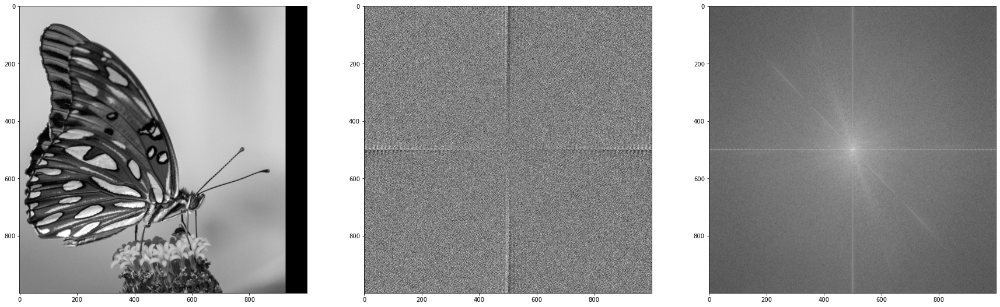

In [18]:
shift = 75

for i in range(q4_img.shape[1] -1, q4_img.shape[1] - shift, -1):
    q4_img = np.roll(q4_img, -1, axis=1)
    q4_img[:, -1] = 0
    
mag = display_mag(q4_img)
phase= get_phase(q4_img)

plt.figure(figsize=(30,30))
plt.subplot(131),plt.imshow(q4_img, cmap = 'gray')
plt.subplot(132),plt.imshow(phase, cmap = 'gray')
plt.subplot(133),plt.imshow(mag , cmap = 'gray')
plt.show() 

# q5

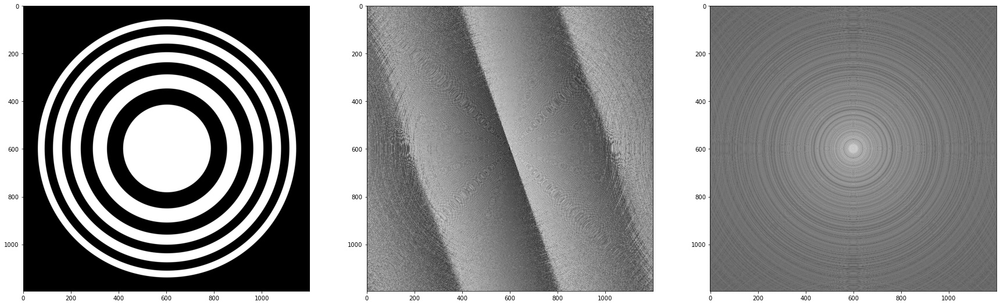

In [19]:
q5_img = cv2.imread('q5.png', 0)
mag = display_mag(q5_img)
phase = get_phase(q5_img)

plt.figure(figsize=(30,30))
plt.subplot(131),plt.imshow(q5_img, cmap = 'gray')
plt.subplot(132),plt.imshow(phase, cmap = 'gray')
plt.subplot(133),plt.imshow(mag , cmap = 'gray')
plt.show() 

In [20]:
def ideal_br(img, d0, w):
    bf = np.ones((img.shape))
    cx = img.shape[0]/2
    cy = img.shape[1]/2
    
    for x in range(bf.shape[0]):
        for y in range(bf.shape[1]):
            d = np.sqrt( (x-cx)**2 + (y-cy)**2 )
            if (d >= d0 and d <= d0 + w):
                bf[x][y] = 0
    
    return bf

(<AxesSubplot:>, <matplotlib.image.AxesImage at 0x1686415dd48>)

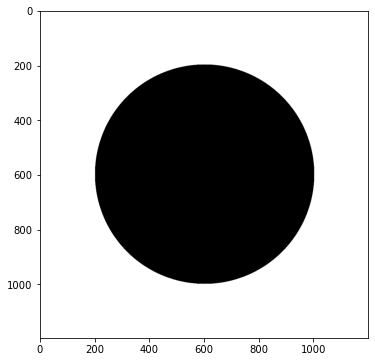

In [21]:
plt.figure(figsize=(20,20))

brf = ideal_br(q5_img, 0, 400)
plt.subplot(131),plt.imshow(brf, cmap = 'gray')

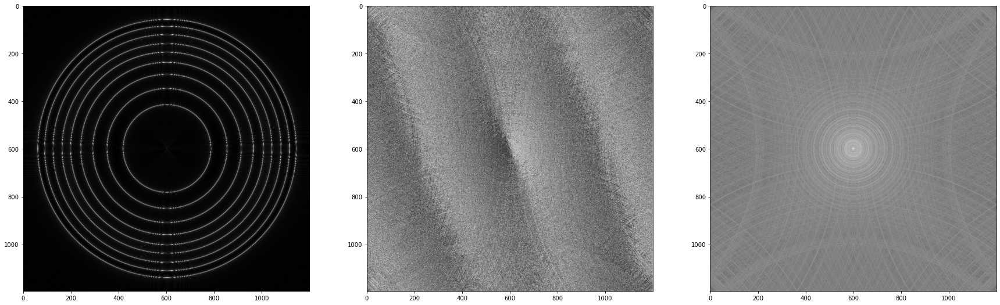

In [22]:
q5_res = mask(q5_img, brf)

mag = display_mag(q5_res)
phase = get_phase(q5_res)

plt.figure(figsize=(30,30))
plt.subplot(131),plt.imshow(q5_res, cmap = 'gray')
plt.subplot(132),plt.imshow(phase, cmap = 'gray')
plt.subplot(133),plt.imshow(mag , cmap = 'gray')
plt.show() 

# Q6

(<AxesSubplot:>, <matplotlib.image.AxesImage at 0x16864c87848>)

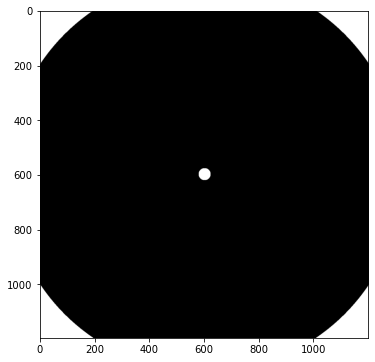

In [23]:
plt.figure(figsize=(20,20))

brf2 = ideal_br(q5_img, 22, 700)
plt.subplot(131),plt.imshow(brf2, cmap = 'gray')

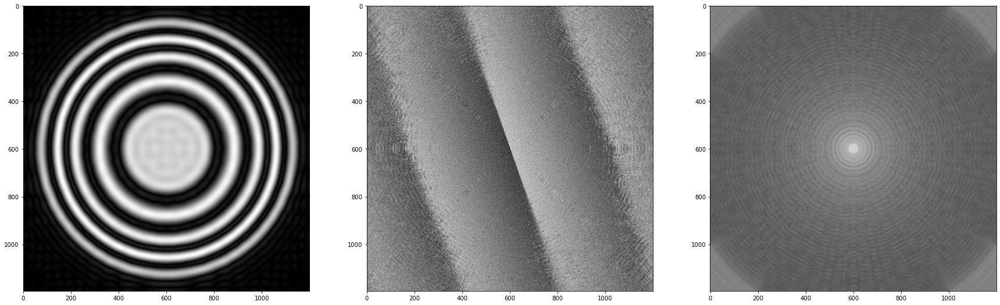

In [24]:
q5_res = mask(q5_img, brf2)

mag = display_mag(q5_res)
phase = get_phase(q5_res)

plt.figure(figsize=(30,30))
plt.subplot(131),plt.imshow(q5_res, cmap = 'gray')
plt.subplot(132),plt.imshow(phase, cmap = 'gray')
plt.subplot(133),plt.imshow(mag , cmap = 'gray')
plt.show() 